# Homework 5


Apply the EDA techniques we learnt today to `flights` dataset and write a short report.

**Results of each code blocks is explained below respective blocks**

In [1]:
import pandas as pd

url = 'https://raw.githubusercontent.com/msaricaumbc/DS_data/master/nyc_flights.csv'
flights = pd.read_csv(url)


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
!python --version

Python 3.9.7


In [4]:
pd.__version__

'1.3.4'

In [5]:
sns.__version__

'0.11.2'

## Univariate Analysis

In [6]:
flights.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336776 entries, 0 to 336775
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   year            336776 non-null  int64  
 1   month           336776 non-null  int64  
 2   day             336776 non-null  int64  
 3   dep_time        328521 non-null  float64
 4   sched_dep_time  336776 non-null  int64  
 5   dep_delay       328521 non-null  float64
 6   arr_time        328063 non-null  float64
 7   sched_arr_time  336776 non-null  int64  
 8   arr_delay       327346 non-null  float64
 9   carrier         336776 non-null  object 
 10  flight          336776 non-null  int64  
 11  tailnum         334264 non-null  object 
 12  origin          336776 non-null  object 
 13  dest            336776 non-null  object 
 14  air_time        327346 non-null  float64
 15  distance        336776 non-null  int64  
 16  hour            336776 non-null  int64  
 17  minute    

In [7]:
flights.head().T

,0,1,2,3,4
year,2013,2013,2013,2013,2013
month,1,1,1,1,1
day,1,1,1,1,1
dep_time,517.0,533.0,542.0,544.0,554.0
sched_dep_time,515,529,540,545,600
dep_delay,2.0,4.0,2.0,-1.0,-6.0
arr_time,830.0,850.0,923.0,1004.0,812.0
sched_arr_time,819,830,850,1022,837
arr_delay,11.0,20.0,33.0,-18.0,-25.0
carrier,UA,UA,AA,B6,DL


1. Data description is aligned with the flights data
2. Datatypes of fields: 5 float, 9 int, 5 object type.

### Null vlaues

In [8]:
null_flights = flights.isnull().sum()
null_flights

year                 0
month                0
day                  0
dep_time          8255
sched_dep_time       0
dep_delay         8255
arr_time          8713
sched_arr_time       0
arr_delay         9430
carrier              0
flight               0
tailnum           2512
origin               0
dest                 0
air_time          9430
distance             0
hour                 0
minute               0
time_hour            0
dtype: int64

1.tail number of 2512 flight records are unknown, tail number is given by FAA for every plane when they are sold and permitted to fly. So null value in tailnum shows that the flight is discontinued. If tailnum is null then dep_delay, arr_delay, arr_time, air_time and dep_time is null too. So we can subtract 2512 from every null field and focus on other null values for further missing value analysis.

In [9]:
#removing common null flights with null tailnum for easier analysis.

null_flights[null_flights!=0] - 2512

dep_time     5743
dep_delay    5743
arr_time     6201
arr_delay    6918
tailnum         0
air_time     6918
dtype: int64

In [10]:
#checkin whether there is any flight with null departure time but not null departure delay.

flights[flights.dep_time.isnull() & flights.dep_delay.notnull()]

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour


2. Now, dep_time null values are 5743 that indicates cancelled flights. And there are no rows with dep_time and dep_delay not being null together. So it makes sense to say the cancelled flights didn't have dep_delay as well. dep_time and dep_delay are highly related to each other.

In [11]:
#checkin whether there is any flight with null departure time but not null arrival time.

flights[flights.arr_time.notnull() & flights.dep_time.isnull() ]

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour


3. When dep_time is null, arr_time is null too, that means we can assume that they are related and focus on flights with null arr_time excluding flights having null values common in dep_time and arr_time fields

In [12]:
print("arr_time with unknown null values: {}".format((null_flights[null_flights!=0] - 2512)['arr_time'] - (5743))) 

arr_time with unknown null values: 458


In [13]:
#checkin the number of flights with null arrival time and not null departure time.

flights[flights.arr_time.isnull() & flights.dep_time.notnull()].shape

(458, 19)

4. **458** flights have null arrival time and these flights were departed but not reached the destination may be because they were diverted or a technical error in database storage system. The perfect reason is unknown.

In [14]:
#checkin whether all flights with null arrival time has null arrival delay too.

print("common null values b/w arr_time and arr_delay : ",
flights[flights.arr_time.isnull() & flights.arr_delay.isnull()].shape[0] - 2512  )

common null values b/w arr_time and arr_delay :  6201


This is same as total null in arr_time, therefore, we can subtract 6201 from arr_delay for further analysis.

arr_delay null count = 6918 - 6201 = 717

5. Thus, **717 flights** doesn't have their arrival delay reported due to unknown situation/circumstances. May be because of unpredictable conditions like Bad Weather, Security Check, External Threats, etc.

In [15]:
flights[flights.air_time.isnull() & flights.arr_delay.isnull()].shape

(9430, 19)

6. air_time and arr_delay are highly related as both fields has same total number of null datapoints. So no different conclusion can be drawn from air_time field.

### Categories

#### a. Categorizing by Carriers

In [81]:
by_carrier = flights.carrier.value_counts()
by_carrier

UA    58665
B6    54635
EV    54173
DL    48110
AA    32729
MQ    26397
US    20536
9E    18460
WN    12275
VX     5162
FL     3260
AS      714
F9      685
YV      601
HA      342
OO       32
Name: carrier, dtype: int64

Carrier with highest flights is UA - United Airlines with **58665** flights

Carrier with lowest flights is OO - Skywest Airlines with **32** flights

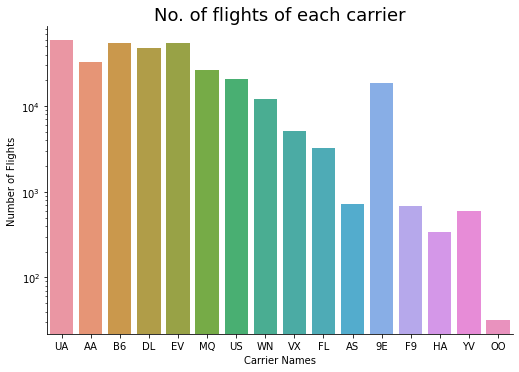

In [17]:
p1 = sns.catplot(data= flights, kind = 'count', x = 'carrier', aspect=1.5)
p1.set(xlabel="Carrier Names", ylabel = "Number of Flights")
plt.title("No. of flights of each carrier", fontdict={'fontsize' : 18})
p1.set(yscale ="log")
plt.show()

#### b. Categorizing carriers having number of flights with a particular plane

In [18]:
group_carrier_tailnum = flights.groupby(by=['carrier','tailnum'])

This gives information of number of flights of a plane categorized by the carrier company. For instance, the plane with N146PQ tail number of 9E carrier has 8 flights in record.

In [19]:
counts = group_carrier_tailnum['tailnum'].count()
counts

carrier  tailnum
9E       N146PQ      8
         N153PQ      5
         N161PQ      3
         N162PQ      2
         N170PQ      7
                    ..
YV       N935LR     10
         N938LR      7
         N939LR     10
         N942LR     12
         N956LR      4
Name: tailnum, Length: 4060, dtype: int64

## Distributions

### Common Destinations

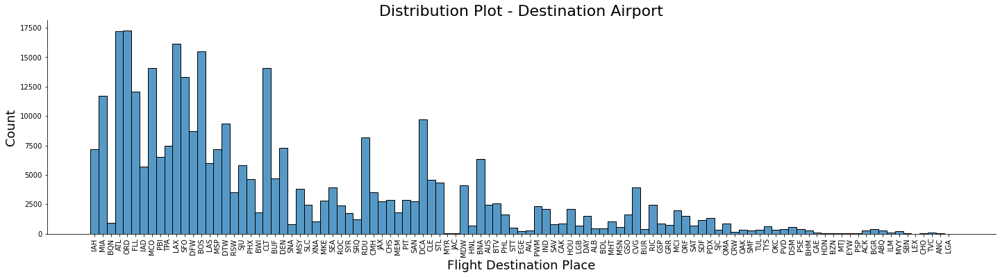

In [94]:
sns.displot(flights, x='dest', kind='hist', aspect=4)
plt.xticks(rotation=90)
plt.title("Distribution Plot - Destination Airport", fontdict={'fontsize' : 22})
plt.xlabel("Flight Destination Place", fontdict={'fontsize' : 18})
plt.ylabel("Count", fontdict={'fontsize' : 18})
plt.show()

This plot shows number of flights reached to the respective destinations. A crucial information like most popular/ least popular destination can be figured out from this plot.

Most Popular Destination according to the data - **Chicago O'Hare International Airport (ORD)**

Least Popular Destination according to the data - JAC, MYR, HDN, BZN, MTJ, EYW, PSP, SBN, LEX, CHO, ANC, LGA

### Origin

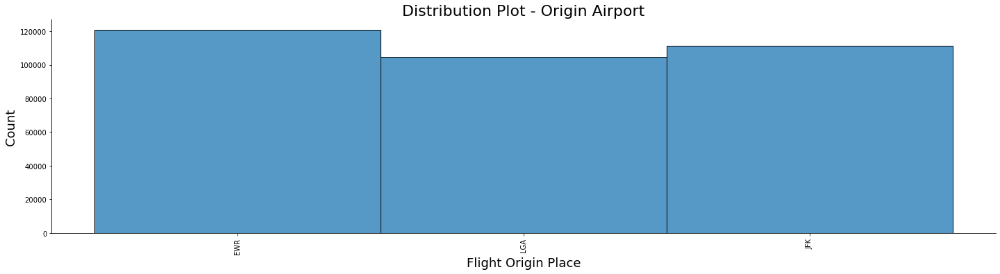

In [93]:
sns.displot(flights, x='origin', kind='hist', aspect=4)
plt.xticks(rotation=90)
plt.title("Distribution Plot - Origin Airport", fontdict={'fontsize' : 22})
plt.xlabel("Flight Origin Place", fontdict={'fontsize' : 18})
plt.ylabel("Count", fontdict={'fontsize' : 18})
plt.show()

It shows only three airports of new york city because it is NYC flights dataset. 

In that too most popular is **EWR: Newark Liberty International Airport**

### Most preferred Departure time

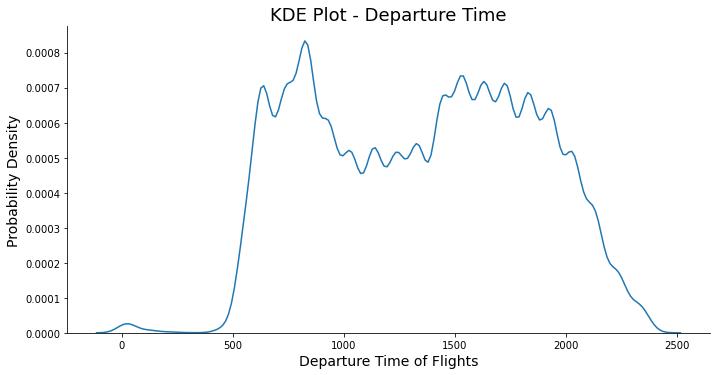

In [98]:
# Plotting departure time
sns.displot(flights, x='dep_time', kind='kde', aspect=2)

plt.title("KDE Plot - Departure Time", fontdict={'fontsize' : 18})
plt.xlabel("Departure Time of Flights", fontdict={'fontsize' : 14})
plt.ylabel("Probability Density", fontdict={'fontsize' : 14})
plt.show()

Here it seems around (7 to 9) hour the probability density is near to 0.8-0.85; and around (16 to 19) hour the probability density is near to (0.73-0.65) decreasing as the evening advances. So the probability density of these two time frames makes it popular as any new departure is more likely to be in this range.

Therefore, we can roughly say that **morning 7am to 9am and evening 4pm to 7pm** is most **popular departure time** and people prefer to travel at this hour.

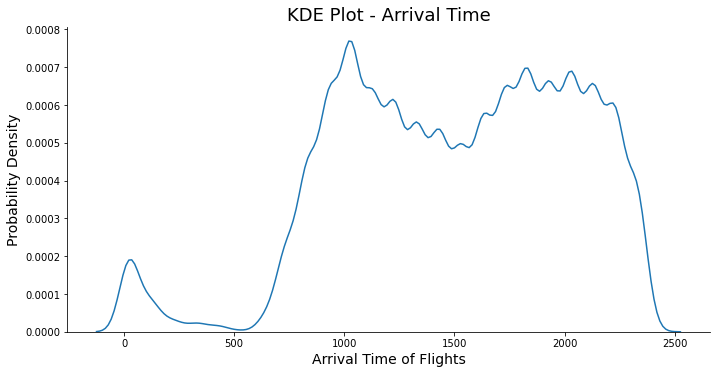

In [99]:
# Plotting Arrival time
sns.displot(flights, x='arr_time', kind='kde', aspect=2)
plt.title("KDE Plot - Arrival Time", fontdict={'fontsize' : 18})
plt.xlabel("Arrival Time of Flights", fontdict={'fontsize' : 14})
plt.ylabel("Probability Density", fontdict={'fontsize' : 14})
plt.show()

Similar to the depature time plot, this plot shows that 

**Most preferred arrival time** is around **10am in morning and 6pm - 10pm in evening.**

## Shape of Dataset

In [107]:
flights.shape

(336776, 19)

It says there are total **336776 records of planes** with 19 fields. 


## Identifying Relationships in the Dataset

### Correlation Matrix

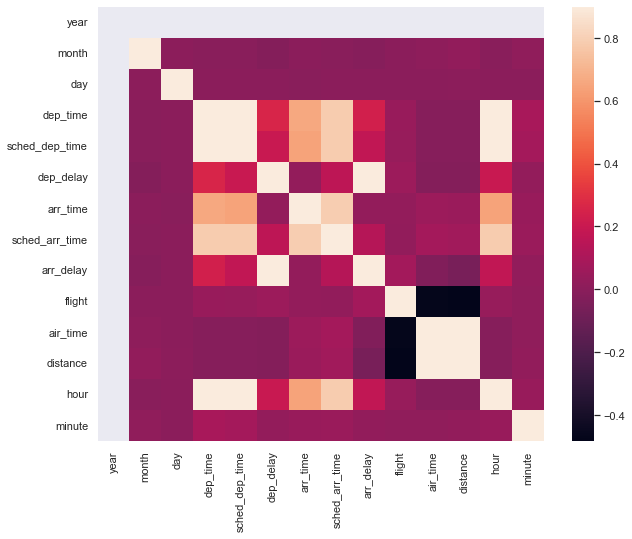

In [86]:
_ = plt.subplots(figsize=(10, 8))
sns.heatmap(flights.corr(), vmax=.9 )

plt.show()

Here the highly correlated fields that matters seems:

    1. Departure delay and Arrival delay. It perfectly makes sense if a flight is departed at a delayed          time, then it will arrive late too. But no direct/strong conclusion be made just based on                heatmap.
    
    2. Air time and Distance are also highly related, as its obvious that more distance will take more          air time for the flight to travel.
    
    3. Other fields like hour, departure time are also highly related but in actual it doesn't make much        sense to focus on those.

### Studying individual relationship - Scatter Plots - Continuous Data

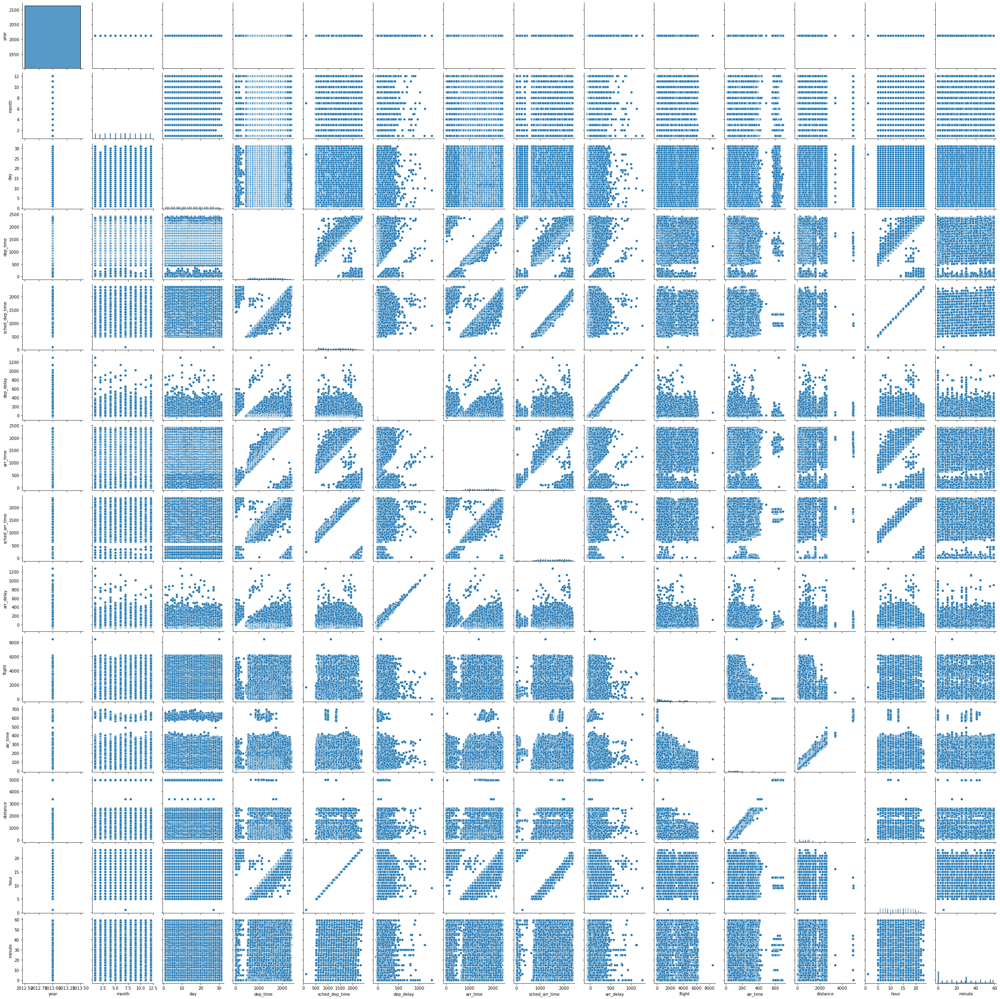

In [39]:
sns.pairplot(flights)

Here focusing on just 2 important relations we derived from heatmap : air_time Vs. distance & arr_delay Vs. dep_delay

1. distance Vs. air_time :

The scatter plot from above pairplot for this relation shows **directly proportional linear relation** which signifies that increase in distance increases air_time too. This result is completely believable as more distance takes more time to travel.

2. dep_delay Vs. arr_delay : 
The scatter plot for this relation also shows **directly proportional linear relation** that explains how delay in departure subsequently leads to delay in arrival time of a flight. It's agreeable to directly relate these two fields to each other.

**Conclusion: We can consider any one of the column from the relation and avoid another to reduce the duplicate calculation and interpretation of analysis(it reduces processing time and CPU power). For instance, we can just take distance and perform our analysis without considering air_time and at last conclude our result for both fields because they are related.**



## Outliers and Flight Frequency

In [ ]:
arr_delay, dep_delay

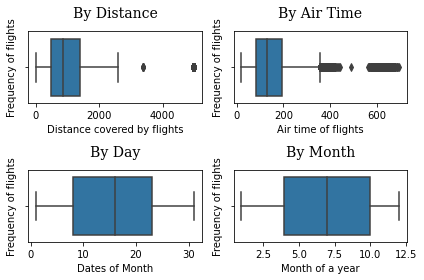

In [65]:
font={'size':14, 'family':'serif'}
plt.figure()
plt.subplot(2,2,1)
plot = sns.boxplot(data = flights, x= 'distance')
plt.title("By Distance", pad=14, fontdict=font)
plt.xlabel("Distance covered by flights")
plt.ylabel("Frequency of flights")

plt.subplot(2,2,2)
plot = sns.boxplot(data = flights, x='air_time')
plt.title("By Air Time", pad=14, fontdict=font)
plt.xlabel("Air time of flights")
plt.ylabel("Frequency of flights")

plt.subplot(2,2,3)
plot = sns.boxplot(data = flights, x= 'day')
plt.title("By Day", pad=14, fontdict=font)
plt.xlabel("Dates of Month")
plt.ylabel("Frequency of flights")

plt.subplot(2,2,4)
plot = sns.boxplot(data = flights, x='month')
plt.title("By Month", pad=14, fontdict=font)
plt.xlabel("Month of a year")
plt.ylabel("Frequency of flights")

plt.tight_layout()
plt.show()

Four important information can be found here:

1. Most flights travel in between 0 to 2000 miles with few outliers travelling more than that around        3000miles and beyond 4000miles
2. Air time of majority of flights is within 2 hours with few flights having 4,5,6 hours of flight air      time. The long hours flight indicates the flights with larger distance travelled.
3. Majority of flights occur between 10th to 25th date of every month.
4. Most of the flights were recorded in between april and october months of the year.

### PROFILING

In [100]:
from pandas_profiling import ProfileReport

In [108]:
report = ProfileReport(flights)
report.to_file(output_file='output.html')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/dakshintwala/opt/anaconda3/lib/python3.9/site-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile report helps to summarize the EDA with an interactive html view.

## Missing Values

I have not deleted the rows with null values because from my point of view every row in this database signifies something.

The rows having null values in tailnum, arr_time, arr_delay, dep_time, dep_delay, air_time signifies that these flights are discontinued and won't be used in future. It can give out crucial information of discontinued flights when we analyse business of flight carriers or check maintenance cost of airports with the help of other datasets.

According to me, the steps of deletion of rows or filling null values with interpolation, filling mean/median values, checking variance/Standard deviation doesn't make much sense in this dataset.

## References:

1.https://drawingfromdata.com/pandas/seaborn/matplotlib/visualization/setting-figure-size-matplotlib-seaborn.html#Drawing-a-figure-with-seaborn

2. https://towardsdatascience.com/histograms-vs-kdes-explained-ed62e7753f12

3. https://www.w3schools.com/python/matplotlib_subplot.asp

4. https://stackoverflow.com/questions/52274643/figsize-in-matplotlib-is-not-changing-the-figure-size

5. https://seaborn.pydata.org/generated/seaborn.scatterplot.html

6. https://towardsdatascience.com/exploratory-data-analysis-with-pandas-profiling-de3aae2ddff3

7. https://intellipaat.com/community/56906/what-is-hue-in-seaborn